In [1]:
import tensorflow as tf

import os
import pathlib
import time
import datetime
import cv2 as cv
from matplotlib import pyplot as plt
from IPython import display
from tensorflow.keras.preprocessing import image
print(tf.config.list_physical_devices('GPU'))
os.makedirs("./cycle_images/maps/", exist_ok=True)

2024-04-19 00:28:45.909556: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-19 00:28:46.055753: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-19 00:28:46.094378: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-19 00:28:47.154111: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2024-04-19 00:28:48.877462: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-04-19 00:28:48.901363: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-04-19 00:28:48.901565: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [2]:
PATH = '/home/khalaq04/.keras/datasets/maps'
PATH = pathlib.Path(PATH)
sample = tf.io.read_file(str(PATH / 'train/44.jpg'))
sample = tf.io.decode_jpeg(sample)
sample.shape

2024-04-19 00:28:48.920033: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-19 00:28:48.920540: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-04-19 00:28:48.920806: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-04-19 00:28:48.921059: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so ret

TensorShape([600, 1200, 3])

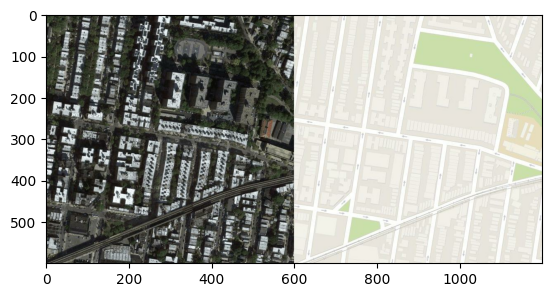

In [3]:
plt.figure()
plt.imshow(sample)

In [4]:
def load(path):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img)

    width = tf.shape(img)[1]
    width = width // 2

    inp = img[:, :width, :]
    label = img[:, width:, :]

    inp = tf.image.resize(inp, [128, 128])
    label = tf.image.resize(label, [128, 128])

    inp = tf.cast(inp, tf.float32)
    label = tf.cast(label, tf.float32)

    return inp, label

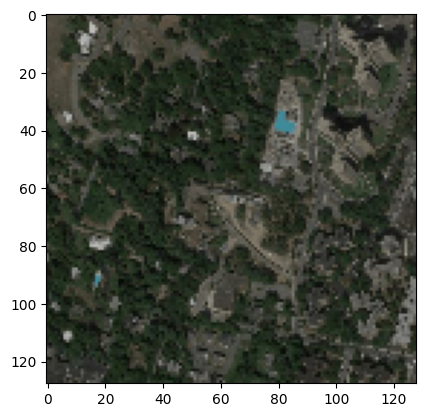

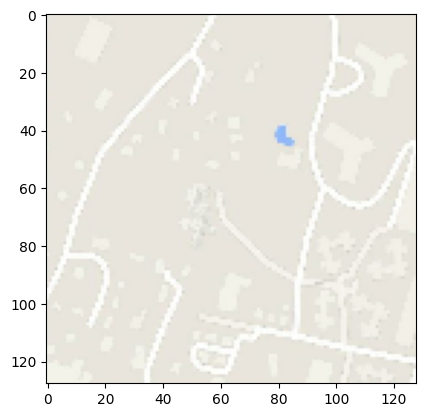

In [5]:
sample_inp, sample_label = load(str(PATH / 'train/100.jpg'))
plt.figure()
plt.imshow(sample_inp / 255.0)
plt.figure()
plt.imshow(sample_label / 255.0)

In [6]:
BUFFER_SIZE = 1096
BATCH_SIZE = 1
IMG_WIDTH = 128
IMG_HEIGHT = 128

In [7]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.BILINEAR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.BILINEAR)

  return input_image, real_image

In [8]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [9]:
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [10]:
@tf.function()
def random_jitter(input_image, real_image):
  input_image, real_image = resize(input_image, real_image, 158, 158)

  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

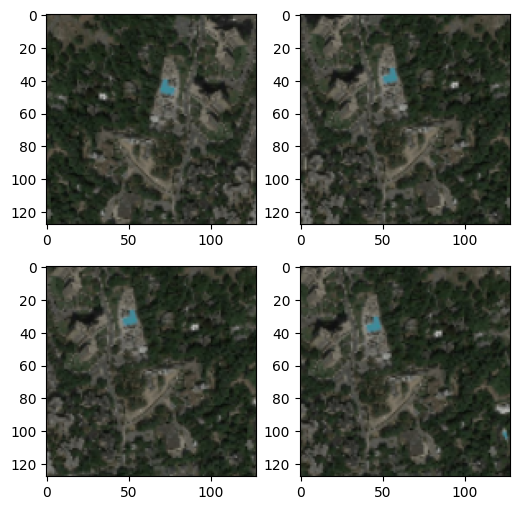

In [11]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(sample_inp, sample_label)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  # plt.axis('off')
plt.show()

In [12]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [13]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [14]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
for i in train_dataset:
    print(i)

(<tf.Tensor: shape=(1, 128, 128, 3), dtype=float32, numpy=
array([[[[-0.55164355, -0.5591967 , -0.58764446],
         [-0.20960152, -0.22346467, -0.31029308],
         [ 0.05333519,  0.06275177, -0.07516277],
         ...,
         [-0.18891943, -0.18451029, -0.22374618],
         [-0.2655794 , -0.25805116, -0.2963221 ],
         [-0.2840647 , -0.27653652, -0.31480747]],

        [[-0.50488293, -0.51036704, -0.5567577 ],
         [-0.1339981 , -0.14410198, -0.25042808],
         [-0.21686041, -0.19924998, -0.3583607 ],
         ...,
         [-0.01289254, -0.00705016, -0.05758971],
         [ 0.03054333,  0.03838646, -0.01021427],
         [-0.04480404, -0.0369609 , -0.08556169]],

        [[-0.47059506, -0.4733215 , -0.53615534],
         [-0.11144489, -0.11882603, -0.23724496],
         [-0.34174615, -0.3148108 , -0.4874484 ],
         ...,
         [-0.06784678, -0.06162477, -0.12057704],
         [-0.01248574, -0.00464261, -0.06260675],
         [-0.02157116, -0.01372802, -0.071692

In [15]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [16]:
def downsample(filters, size, apply_batchnorm=True, dropout=0.0):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  if dropout:
    result.add(tf.keras.layers.Dropout(dropout))

  return result

In [17]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(sample_inp, 0))
print (down_result.shape)

2024-04-19 00:28:56.174029: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8600


(1, 64, 64, 3)


In [18]:
def upsample(filters, size, dropout=0.0):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if dropout:
      result.add(tf.keras.layers.Dropout(dropout))

  result.add(tf.keras.layers.ReLU())

  return result

In [19]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 128, 128, 3)


In [20]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4, dropout=0.5),
        downsample(512, 4, dropout=0.5),
        downsample(512, 4, dropout=0.5),
        downsample(512, 4, dropout=0.5, apply_batchnorm=False)
    ]

    up_stack = [
        upsample(512, 4, dropout=0.5),
        upsample(512, 4, dropout=0.5),
        upsample(512, 4, dropout=0.5),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4)
    ]

    initializer = tf.random_normal_initializer(0, 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4, 2, 'same', kernel_initializer=initializer, activation='tanh')

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

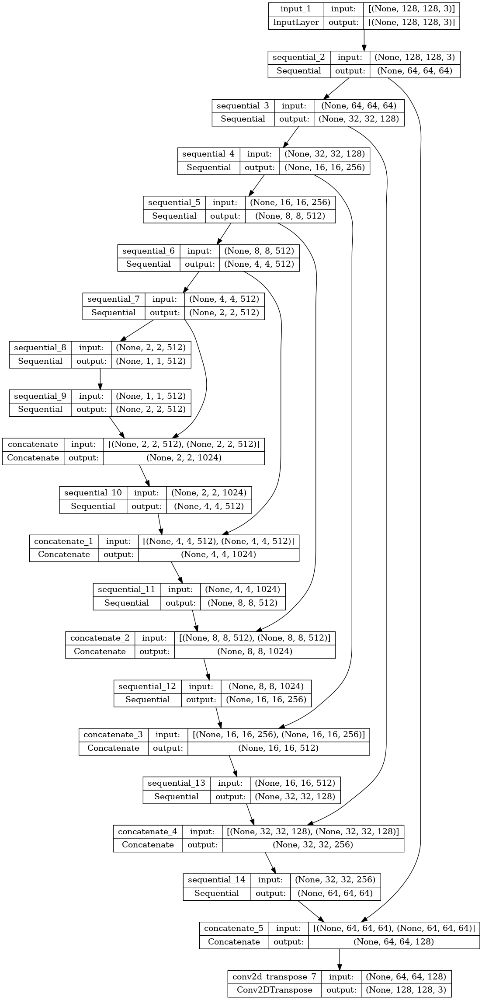

In [21]:
G_AB = Generator()
G_BA = Generator()
tf.keras.utils.plot_model(G_AB, show_shapes=True)

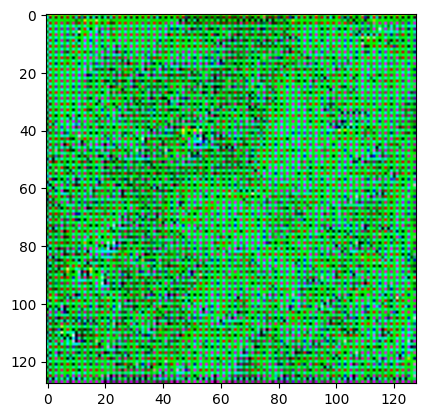

In [22]:
gen_output_testAB = G_AB(sample_inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output_testAB[0, ...])

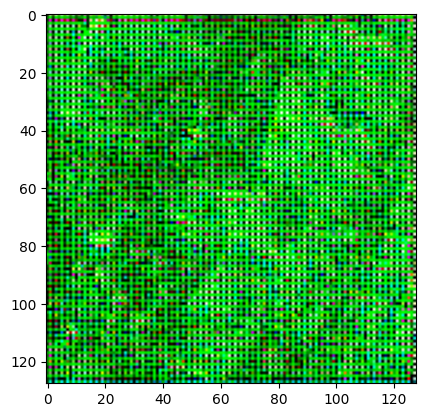

In [23]:
gen_output_testBA = G_BA(sample_inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output_testBA[0, ...])

In [24]:
lambda_adv = 1
lambda_cycle = 10
lambda_gp = 10

In [25]:
cycle_loss = tf.keras.losses.MeanAbsoluteError()

In [26]:
def Discriminator():
    initializer = tf.random_normal_initializer(0, 0.02)

    inp = tf.keras.layers.Input(shape=[IMG_WIDTH,IMG_HEIGHT,3], name="input_image")

    down1 = downsample(64, 4, False)(inp)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = tf.keras.layers.ZeroPadding2D(((1, 0), (1, 0)))(down3)
    conv = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)

    return tf.keras.Model(inputs=inp, outputs=conv)

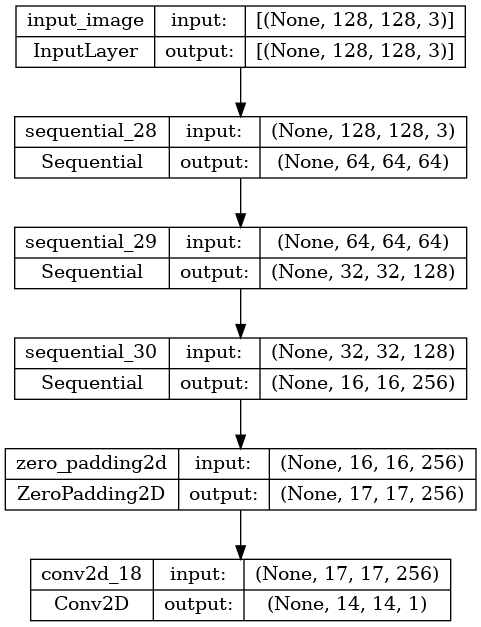

In [27]:
D_A = Discriminator()
D_B = Discriminator()
tf.keras.utils.plot_model(D_A, show_shapes=True)

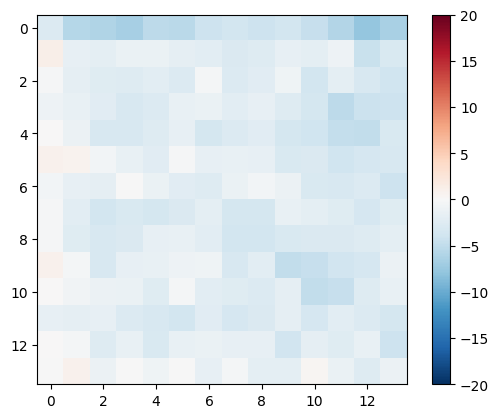

In [28]:
disc_out = D_A(sample_inp[tf.newaxis, ...], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

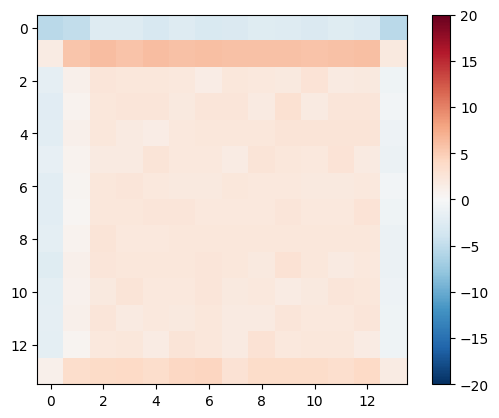

In [29]:
disc_out = D_B(sample_label[tf.newaxis, ...], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

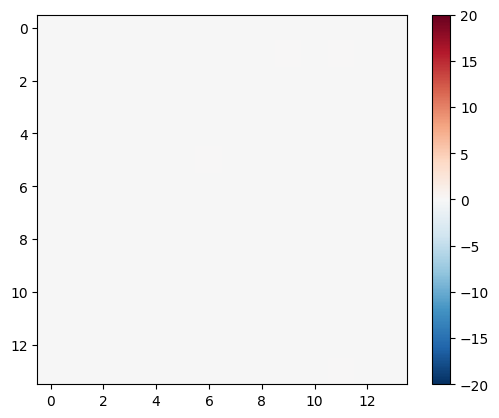

In [30]:
disc_out = D_A(gen_output_testAB, training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

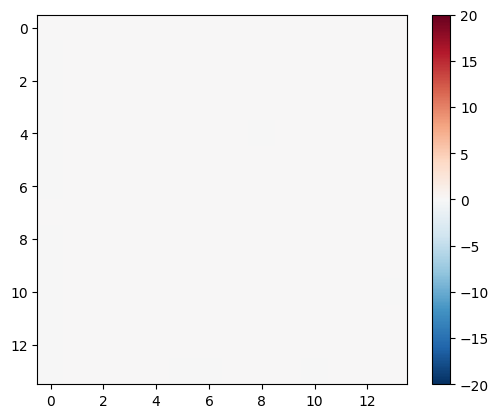

In [31]:
disc_out = D_B(gen_output_testBA, training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [32]:
# def compute_gradient_penalty(D, real_samples, fake_samples):
#     alpha = tf.random.uniform(shape=[real_samples.shape[0], 1, 1, 1], minval=0.0, maxval=1.0)
#     interpolates = (alpha * real_samples + (1 - alpha) * fake_samples)
#     interpolates = tf.Variable(interpolates, trainable=True)
    
#     with tf.GradientTape() as tape:
#         tape.watch(interpolates)
#         validity = D(interpolates)

#     gradients = tape.gradient(validity, interpolates)
#     gradients = tf.reshape(gradients, [gradients.shape[0], -1])
#     gradient_penalty = tf.reduce_mean(tf.square(tf.norm(gradients, axis=1) - 1))

#     return gradient_penalty

In [33]:
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999

optimizer_G = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta_1, beta_2=beta_2)
optimizer_D_A = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta_1, beta_2=beta_2)
optimizer_D_B = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=beta_1, beta_2=beta_2)

In [34]:
def sample_images(imgs, batches_done):
    real_A, real_B = imgs
    fake_B = G_AB(real_A, training=False)
    AB = tf.concat([real_A, fake_B], axis=-2)
    fake_A = G_BA(real_B, training=False)
    BA = tf.concat([real_B, fake_A], axis=-2)
    img_sample = tf.concat([AB, BA], axis=1)
    save_image(img_sample, "./cycle_images/maps/{}.png".format(batches_done), nrow=1)

def save_image(img_sample, filename, nrow):
    img_sample = (img_sample + 1) * 0.5
    img_sample = tf.clip_by_value(img_sample, 0.0, 1.0)
    img_grid = tf.concat([tf.concat(img_row, axis=1) for img_row in tf.split(img_sample, nrow, axis=0)], axis=0)
    img_grid = tf.squeeze(img_grid) if img_grid.shape[-1] == 1 else img_grid
    img_grid = img_grid[0]
    plt.figure(figsize=(10,10))
    plt.imshow(img_grid)
    plt.show()
    img_grid *= 255.0
    image.save_img(filename, img_grid, scale=False)

In [38]:
@tf.function
def train_step(batch):
    imgs_A, imgs_B = batch
    
    with tf.GradientTape(persistent=True) as tape:
        fake_A = G_BA(imgs_B, training=True)
        fake_B = G_AB(imgs_A, training=True)
        
        gp_A = compute_gradient_penalty(D_A, imgs_A, fake_A, lambda_gp)
        gp_B = compute_gradient_penalty(D_B, imgs_B, fake_B, lambda_gp)

        D_A_loss = -tf.reduce_mean(D_A(imgs_A)) + tf.reduce_mean(D_A(fake_A)) + gp_A
        D_B_loss = -tf.reduce_mean(D_B(imgs_B)) + tf.reduce_mean(D_B(fake_B)) + gp_B
        D_loss = D_A_loss + D_B_loss

        G_adv = -tf.reduce_mean(D_A(fake_A)) - tf.reduce_mean(D_B(fake_B))

        recov_A = G_BA(fake_B, training=True)
        recov_B = G_AB(fake_A, training=True)
        G_cycle = cycle_loss(recov_A, imgs_A) + cycle_loss(recov_B, imgs_B)

        G_loss = lambda_adv * G_adv + lambda_cycle * G_cycle

    D_grads = tape.gradient(D_loss, D_A.trainable_variables + D_B.trainable_variables)
    optimizer_D_A.apply_gradients(zip(D_grads[:len(D_A.trainable_variables)], D_A.trainable_variables))
    optimizer_D_B.apply_gradients(zip(D_grads[len(D_A.trainable_variables):], D_B.trainable_variables))

    G_grads = tape.gradient(G_loss, G_BA.trainable_variables + G_AB.trainable_variables)
    optimizer_G.apply_gradients(zip(G_grads[:len(G_BA.trainable_variables)], G_BA.trainable_variables))
    optimizer_G.apply_gradients(zip(G_grads[len(G_BA.trainable_variables):], G_AB.trainable_variables))


def compute_gradient_penalty(D, real_samples, fake_samples, lambda_gp):
    alpha = tf.random.uniform(shape=[real_samples.shape[0], 1, 1, 1], minval=0.0, maxval=1.0)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples)
    
    with tf.GradientTape() as tape:
        tape.watch(interpolates)
        validity = D(interpolates, training=True)

    gradients = tape.gradient(validity, interpolates)
    gradients = tf.reshape(gradients, [gradients.shape[0], -1])
    gradient_penalty = lambda_gp * tf.reduce_mean(tf.square(tf.norm(gradients, axis=1) - 1))

    return gradient_penalty


# def cycle_loss(reconstructed, original):
#     return tf.reduce_mean(tf.abs(reconstructed - original))

In [39]:
def fit(train_ds, test_ds, steps):
    imgs = next(iter(test_ds.take(1)))
    start = time.time()

    for step, batch in train_ds.repeat().take(steps).enumerate():
        if step % 1000 == 0:
            display.clear_output(wait=True)
            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')
            start = time.time()
            sample_images(imgs, step)
            print(f"Step: {step//1000}k")
        train_step(batch)
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)

Time taken for 1000 steps: 162.95 sec



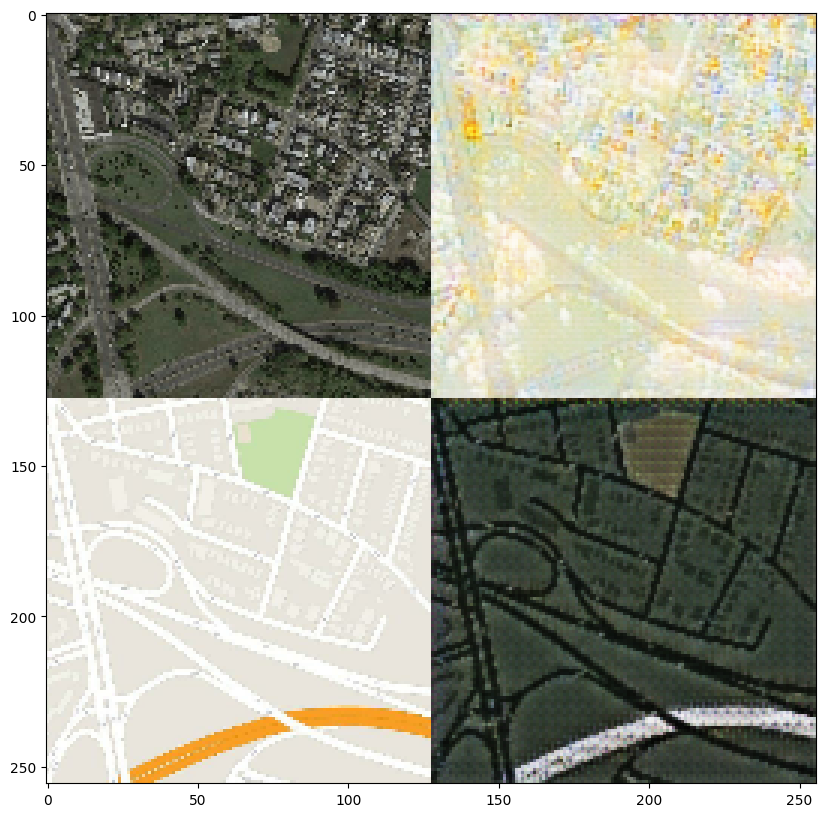

Step: 19k
....................................................................................................

In [40]:
fit(train_dataset, test_dataset, steps=20000)

In [43]:
def gen_images(imgs):
    real_A, real_B = imgs
    fake_B = G_AB(real_A, training=False)
    AB = tf.concat([real_A, fake_B], axis=-2)
    fake_A = G_BA(real_B, training=False)
    BA = tf.concat([real_B, fake_A], axis=-2)
    img_sample = tf.concat([AB, BA], axis=1)
    show_image(img_sample, nrow=1)

def show_image(img_sample, nrow):
    img_sample = (img_sample + 1) * 0.5
    img_sample = tf.clip_by_value(img_sample, 0.0, 1.0)
    img_grid = tf.concat([tf.concat(img_row, axis=1) for img_row in tf.split(img_sample, nrow, axis=0)], axis=0)
    img_grid = tf.squeeze(img_grid) if img_grid.shape[-1] == 1 else img_grid
    img_grid = img_grid[0]
    plt.figure(figsize=(10,10))
    plt.imshow(img_grid)
    plt.show()

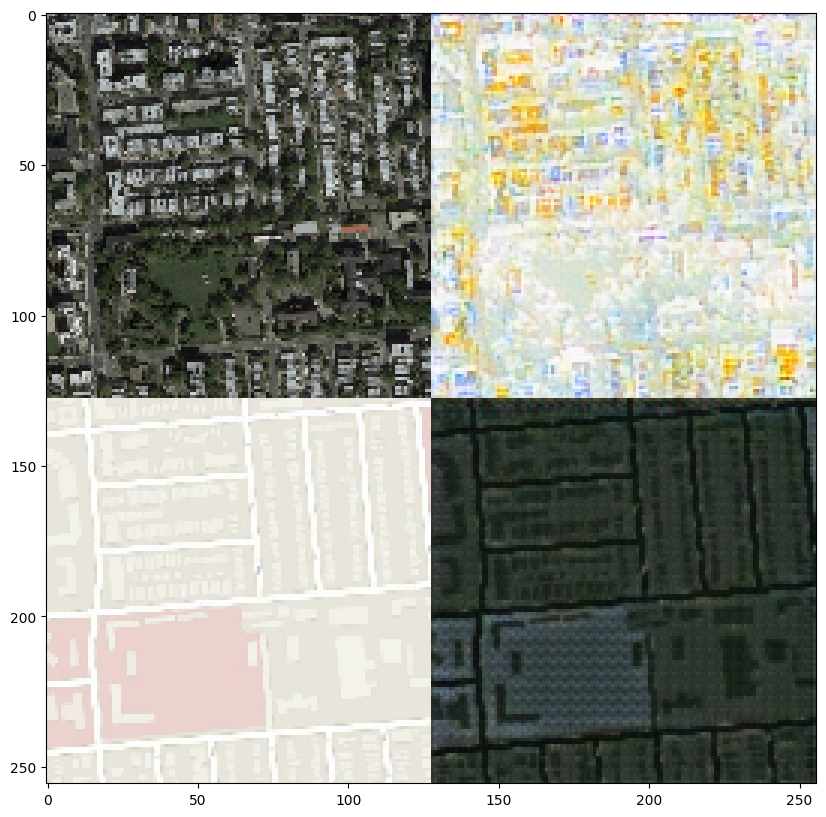

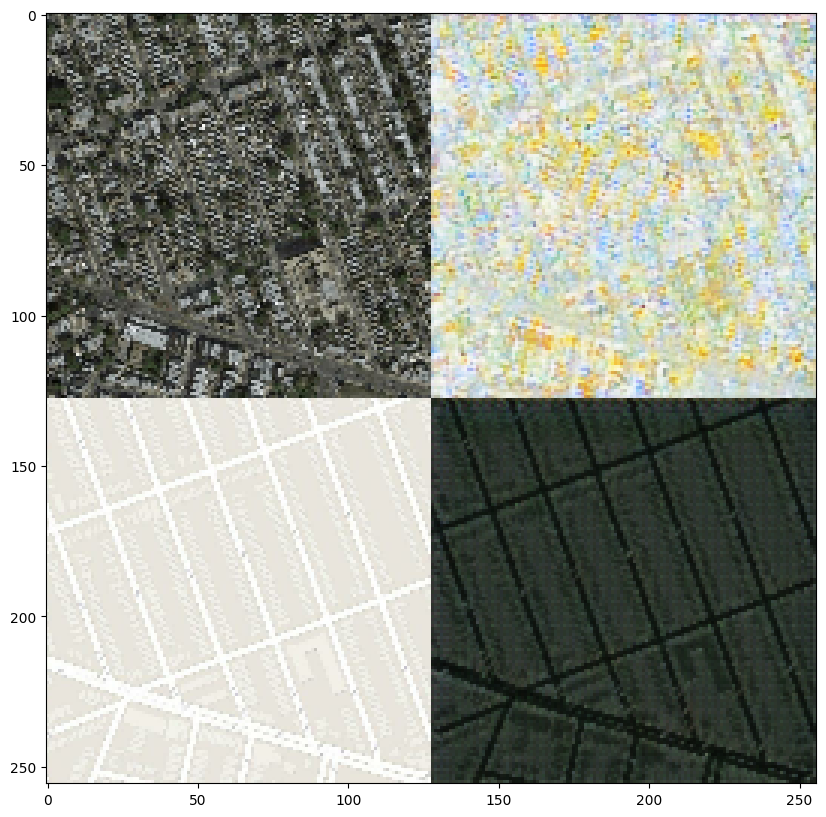

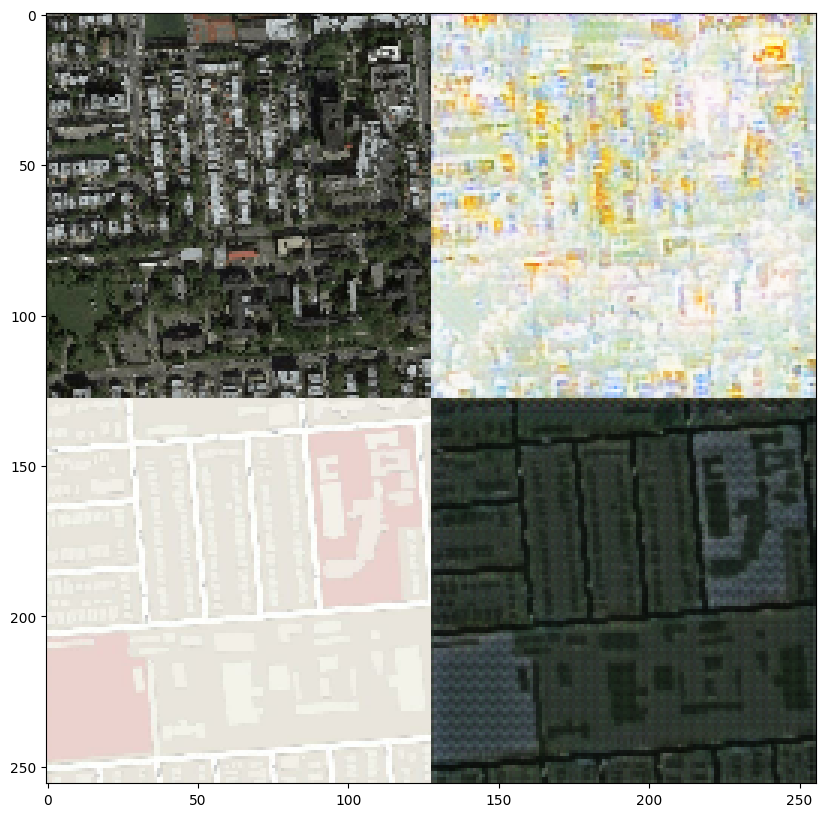

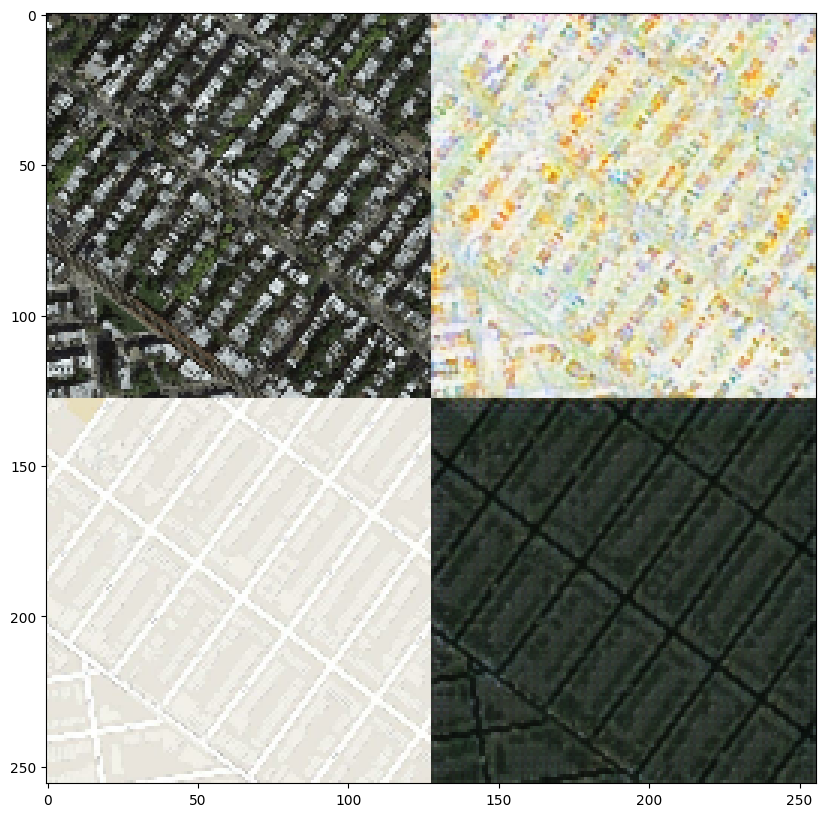

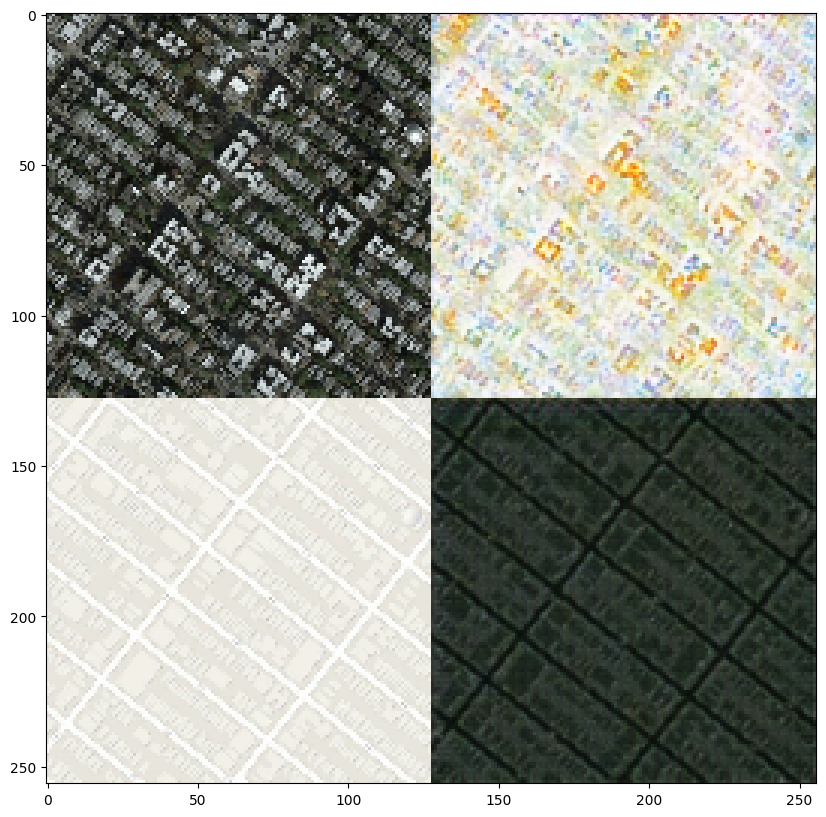

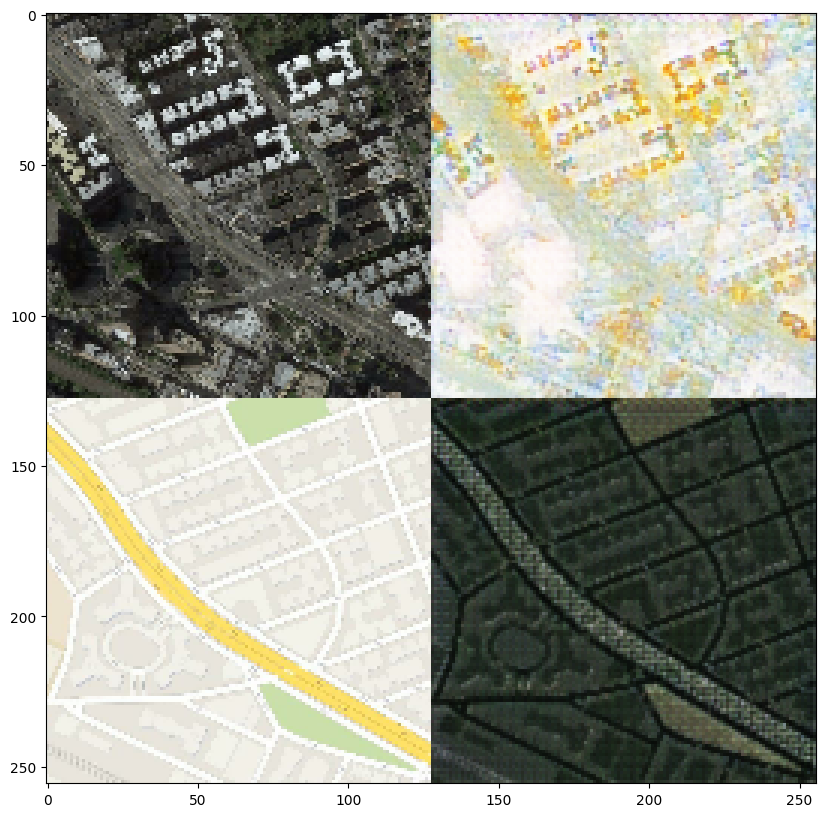

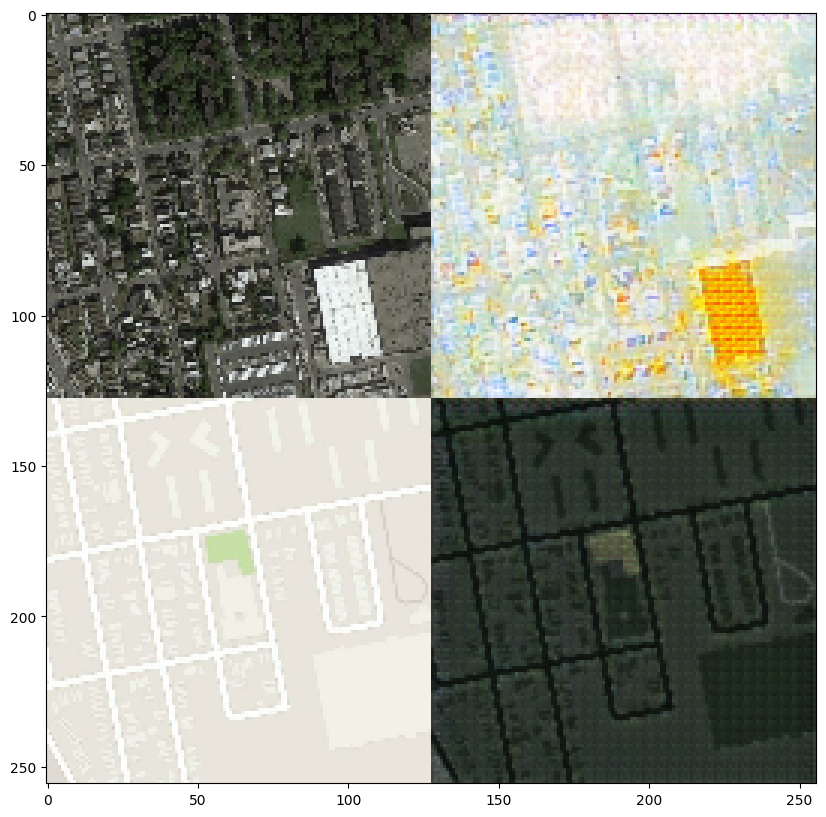

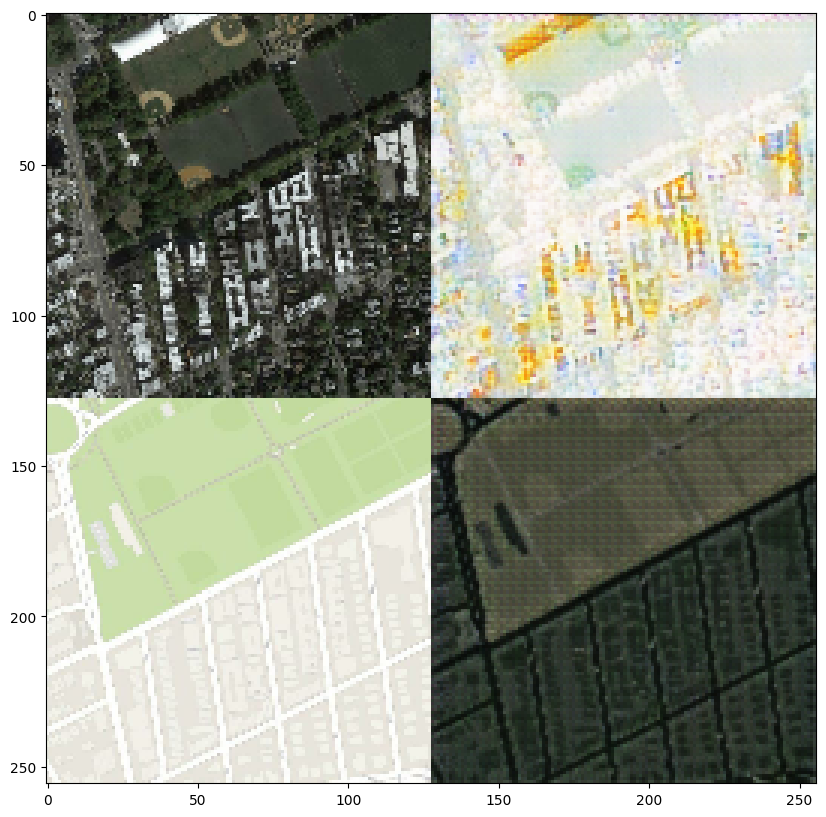

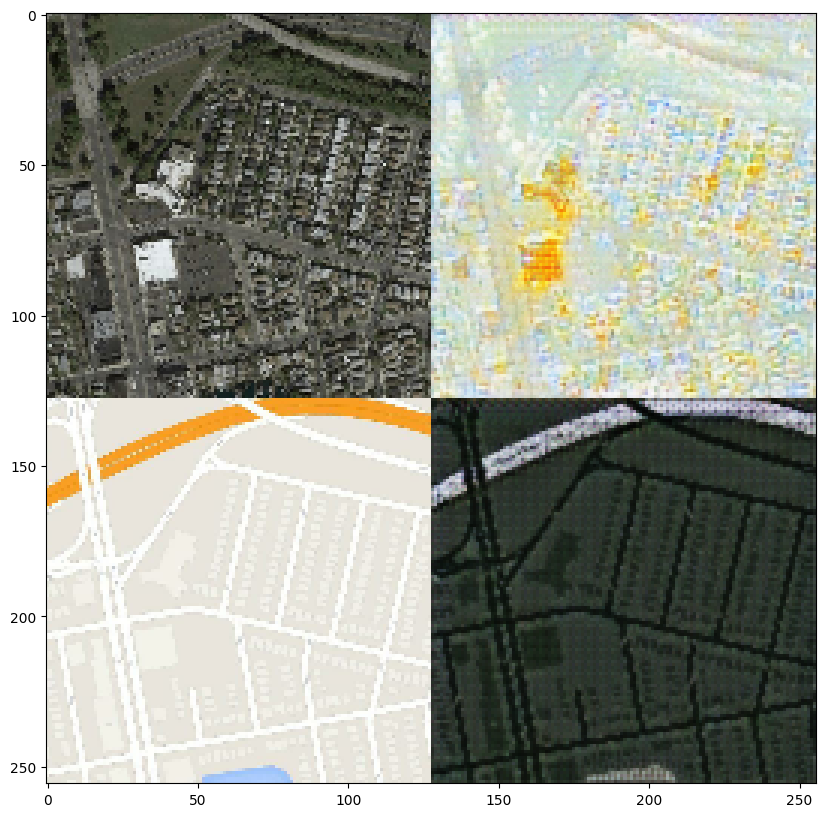

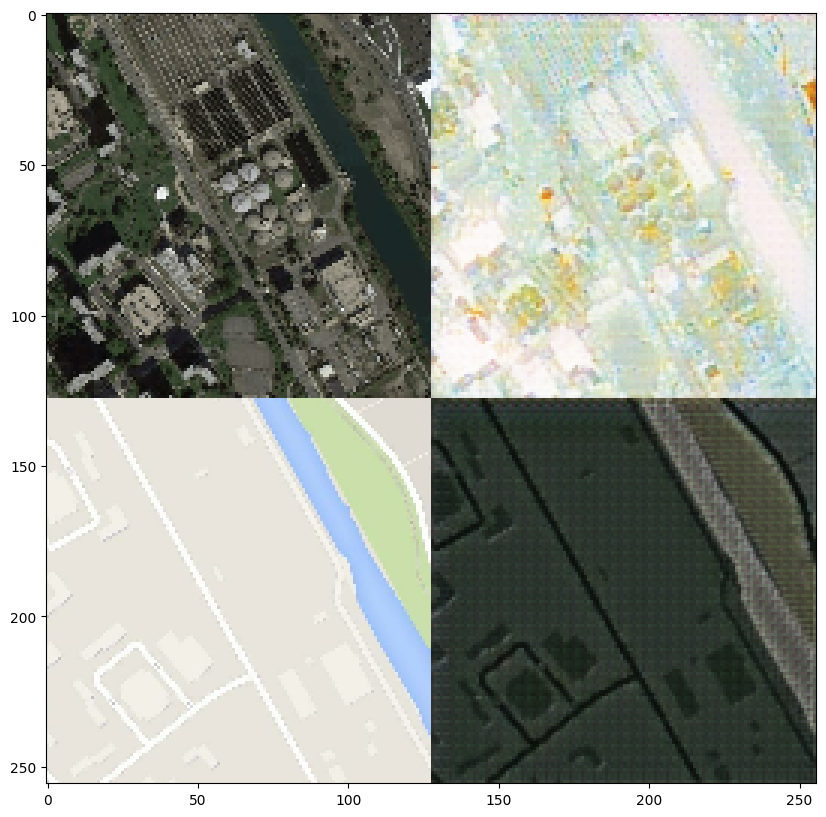

: 

In [44]:
for imgs in test_dataset.take(10):
    gen_images(imgs)